## 一、百年奥运发展史

### （一）历届夏季奥运会各维度分析
- [历年参赛国家数量](#line)
- [历年参赛运动员人数](#bar)
- [不同运动项目的比赛数量](#dot)
- [历年夏季奥运会赛事最丰富的前15个运动项目](#rose)
- [男女性别比例变化](#gender)
- [夏季奥运会中各运动项目男女累计占比](#bar2)
- [参赛者平均年龄变化](#avgage)

### （二）不同参赛国家各维度数据分析
- [运动员人数变化](#athlete)
- [参赛人数top20的国家金银铜牌数均值对比](#medal)
- [参赛人数top30的国家金银铜牌总数对比](#comparison)
- [奥运金牌总榜top20国家排序](#top20)
- [主场效应-近9届奥运会东道主金牌表现](#gold)
- [参赛人数总和top50国家排序](#top50)
- [依据历届奥运会举办次数排序的各大城市](#city)
- [绘制历年夏季奥运会各国奖牌获得情况](#map)
- [中国&体育强国奥运金牌男女项目比例汇总](#circle)
- [中国&体育强国金牌运动员年龄分布对比](#nianling)
- [21世纪体育强国夺牌率](#duopai)

## 二、中国体育新征程
- [中国奥运征程（中国金牌数变化趋势+和金牌榜top5的对比）](#china)
- [中国奥运奖牌历史趋势](#CHistory)
- [中国历届夏季奥运会奖牌数](#tree)
- [中国强势项目](#CEvent)
- [中国获金、银、铜牌选手年龄分布](#CAge)
- [中国优势项目及选手----以男子乒乓球单打为例](#pingpong)

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.ticker as ticker
from matplotlib.font_manager import _rebuild
from IPython.display import HTML
import seaborn as sns
from pyecharts import options as opts
from pyecharts.commons.utils import JsCode
from pyecharts.globals import ThemeType
from pyecharts.charts import Map, Bar, Timeline, Grid, Line, Tree, Pie
from scipy.interpolate import make_interp_spline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# 设置全局的图形参数
sns.set_style(
    # 图形风格
    "whitegrid", 
    # 网格默认不显示
    {'axes.grid' : False})

sns.set_context(rc={
    # 标题大小
    'axes.titlesize': 25,
    # 轴的上标题大小
    'axes.labelsize': 20,
    # x轴刻度文字大小
    'xtick.labelsize': 15, 
    # y轴刻度文字大小
    'ytick.labelsize': 15})

# 设置中文显示
# 不同系统的设置方式可能会有所不同！
_rebuild()
matplotlib.rcParams['font.family']=['FangSong']
matplotlib.rcParams['axes.unicode_minus'] = False
%matplotlib inline
plt.rcParams['figure.figsize'] = [16,10]
plt.rcParams['figure.dpi'] = 140
plt.rcParams['font.size'] = 20

## 导入数据&数据预处理

In [90]:
# df1 = pd.read_csv('athlete_events_o.csv')
# df2 = pd.read_csv('noc_regions.csv',encoding='gbk')
# df3 = pd.read_excel('sports.xlsx')
# df4 = pd.read_excel('citys.xlsx')
# df = pd.merge(df1,df2,on=['NOC']) # 合并
# df = pd.merge(df,df3,on=['Sport'])
# df = pd.merge(df,df4,on=['City'])
# df = df.drop(columns=['Sport','City'])
# df=df.rename(columns={'Sport_C':'Sport','City_c':'City'})
# df.to_csv("olimpic.csv",index=False,encoding="utf_8_sig")

In [8]:
data = pd.read_csv('olimpic.csv')
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,Event,Medal,region,region_Eng,Sport,City,性别,年份
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Basketball Men's Basketball,NaN,中国,China,篮球,巴塞罗那,男,1992
1,22659,Cong Xuedi,F,29.0,166.0,58.0,China,CHN,1992 Summer,1992,Summer,Basketball Women's Basketball,Silver,中国,China,篮球,巴塞罗那,女,1992
2,41426,Gong Xiaobin,M,22.0,202.0,100.0,China,CHN,1992 Summer,1992,Summer,Basketball Men's Basketball,NaN,中国,China,篮球,巴塞罗那,男,1992
3,46930,He Jun,F,23.0,178.0,68.0,China,CHN,1992 Summer,1992,Summer,Basketball Women's Basketball,Silver,中国,China,篮球,巴塞罗那,女,1992
4,50576,Hu Weidong,M,21.0,198.0,87.0,China,CHN,1992 Summer,1992,Summer,Basketball Men's Basketball,NaN,中国,China,篮球,巴塞罗那,男,1992


In [9]:
# 只选取夏奥
data = data[data['Season'] == 'Summer']
data.shape

(222552, 19)

# 一、百年奥运发展史

# （一）历届夏季奥运会各维度数据分析

## <span id="line">历年参赛国家数量</span>

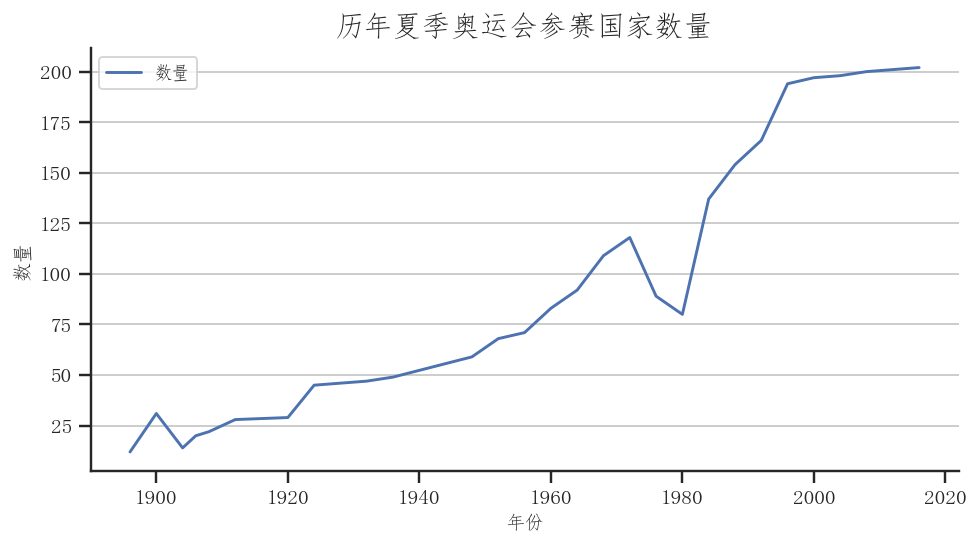

In [136]:
country_num = data.groupby(['Year'])['region'].nunique().reset_index().rename(columns={'region': 'region_num'})

# print(country_num)
plt.figure(figsize=(8, 4))
sns.lineplot(x='Year', y='region_num', data=country_num, label='数量')
sns.despine()
plt.legend(fancybox=True, prop={'size': 9})
plt.grid(axis='y')
plt.xlabel('年份',fontsize=10)
plt.ylabel('数量',fontsize=10)
plt.title('历年夏季奥运会参赛国家数量',fontsize=15)
plt.show()

## <span id="bar">历年参赛运动员人数</span>

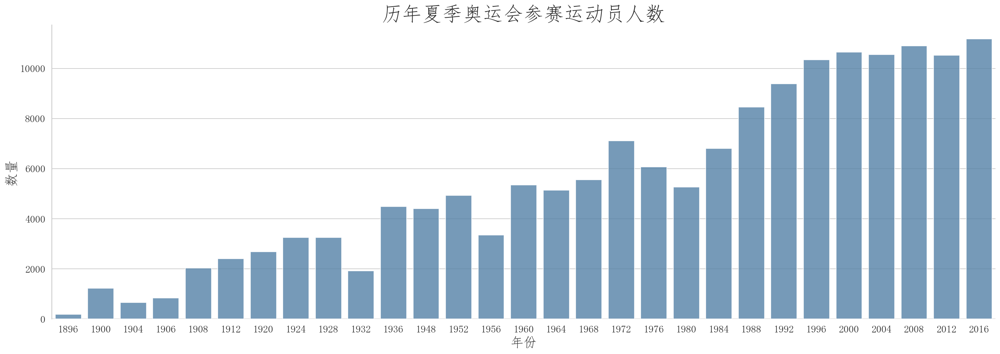

In [94]:
athlete_num = data.groupby(['Year'])['ID'].nunique().reset_index().rename(columns={'ID': 'ID_num'})

# print(athlete_num)
plt.figure(figsize=(25, 8))
sns.barplot(x='Year', y='ID_num', data=athlete_num,color='steelblue', alpha=0.8)

# 同时去掉底部边框
sns.despine(bottom=True)
plt.grid(axis='y')
plt.xlabel('年份',fontsize=20)
plt.ylabel('数量',fontsize=20)
plt.title('历年夏季奥运会参赛运动员人数',fontsize=30)
plt.show()

## <span id="dot">历年夏季奥运会不同运动项目的比赛数量</span>

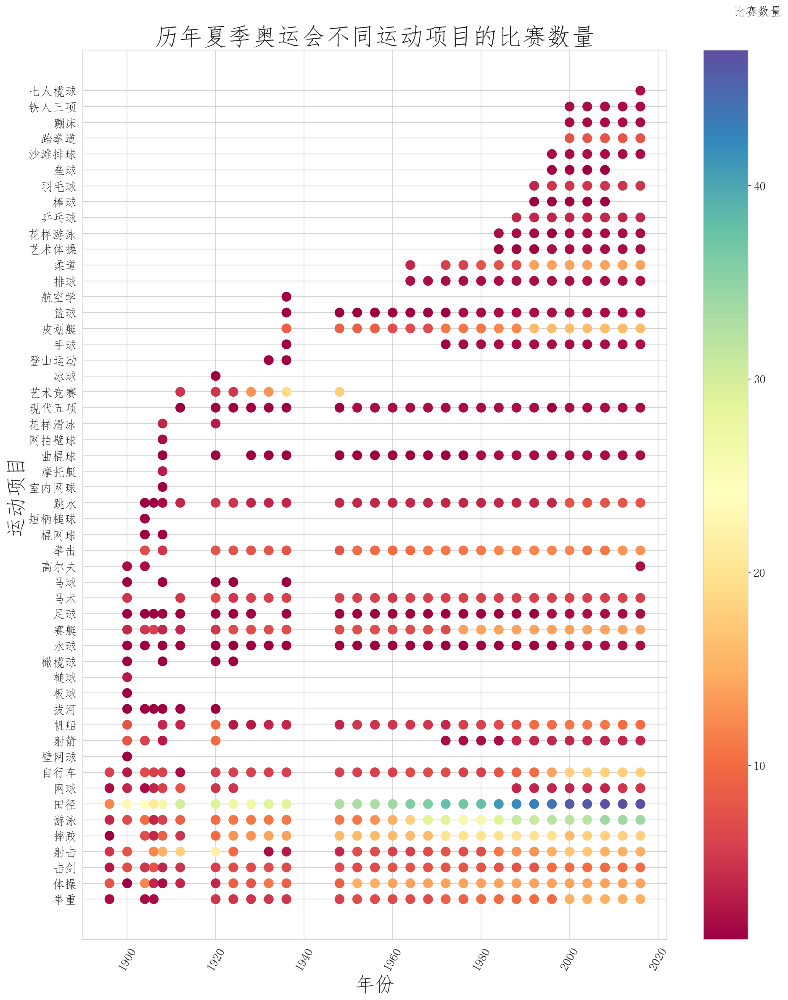

In [18]:
## 气泡图
sport_num = df.groupby(['Year', 'Sport'])['Event'].nunique().reset_index().rename(columns={'Event':'Event_num'})

fig = plt.figure(figsize=(16, 20))
plt.scatter(x='Year', y='Sport', c='Event_num', s=120, 
            data=sport_num, cmap='Spectral')#'OrRd')
# 设置colorbar标题
clb = plt.colorbar()
clb.set_label('比赛数量', labelpad=-10, y=1.05, rotation=0, fontsize=15)
plt.grid()
plt.xlabel('年份',fontsize=25)
plt.ylabel('运动项目',fontsize=25)
plt.xticks(rotation=60)
plt.title('历年夏季奥运会不同运动项目的比赛数量',fontsize=30)
plt.show()

## <span id="rose">历年夏季奥运会赛事最丰富的前15个运动项目</span>

In [96]:
sport_num1 = data.groupby(['Sport'])['Event'].nunique().reset_index().rename(columns={'Event':'Event_num'})
sport_num1 = sport_num1.sort_values(by='Event_num', ascending = False).reset_index()
sports = sport_num1['Sport'][:15]
num = sport_num1['Event_num'][:15]

c = (
    Pie()
    .add(
        "",
        [list(z) for z in zip(sports, num)],
        radius=["30%", "75%"],
        rosetype="radius",
        center=["35%", "50%"],
        # label_opts=opts.LabelOpts(is_show=False),
    )
    .set_global_opts(title_opts=opts.TitleOpts(title="历年夏季奥运会赛事最丰富的前15个运动项目"),
                     legend_opts=opts.LegendOpts(pos_bottom='bottom'))
   # .render("pie_rosetype.html")
)

c.render_notebook()

## <span id="gender">男女性别比例变化</span>

In [6]:
# 对表格每一行求比例
def cal_percent_byrow(data:pd.DataFrame):
    return data.div(data.sum(axis=1),axis=0)
# 对列比例
def cal_percent(col:pd.Series):
    return col/col.sum()
# 柱状图
def plot_bar(data,**kws):
    data.plot.bar(**kws)
# 条形图
def plot_barh(data,**kws):
    data.plot.barh(**kws,color=['pink','turquoise'])

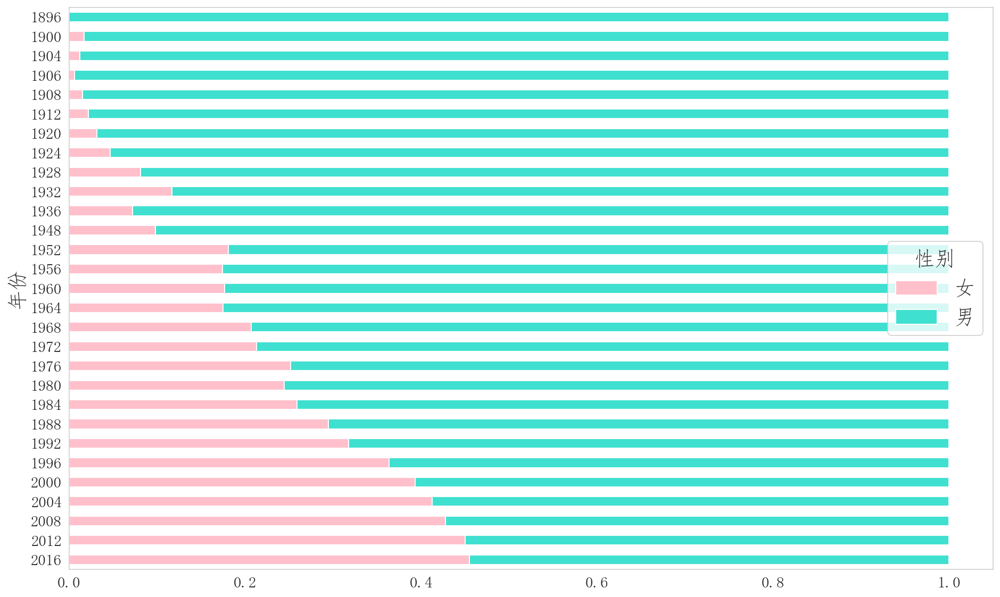

In [11]:
data.pivot_table(index='年份',
               columns='性别',
               aggfunc='size',
               fill_value=0).pipe(cal_percent_byrow).sort_values('年份',ascending=False).pipe(plot_barh,stacked=True)

## <span id="bar2">夏季奥运会中各运动项目男女累计占比</span>

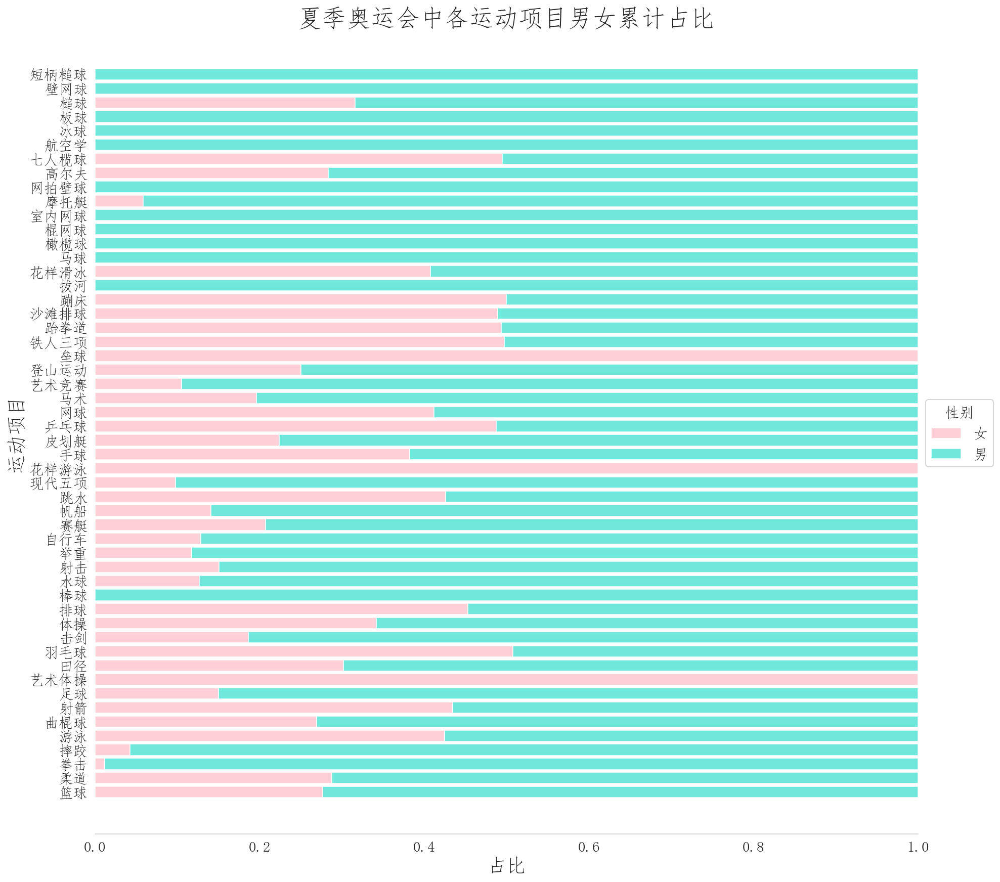

In [16]:
df = data.copy()
df['sex_n'] = df.apply(lambda df : 2 if df['Sex'] == 'F' else 0, axis = 1)
## 男女比例图
sports = df[['sex_n', 'Sport']].copy()
sports_r = sports.groupby(['Sport'])['sex_n'].count().reset_index()
sports_r.head() # Sport sex_n
sports_r = pd.DataFrame(columns=['sport', 'female', 'male'])
for item in sports['Sport'].unique():
    a = sports[sports['Sport']==item]
    b = a['sex_n'].value_counts()
    c = 0 #male
    d = 0 #female
    e = list(b.index)
    if b.size==2:
        c = b[0]/(b[0]+b[2])
        d = b[2]/(b[0]+b[2])
    elif e[0]==0: 
            c = 1
    else:
        d = 1
    c = pd.DataFrame([[item, d, c]],columns=['sport', 'female', 'male'])
    sports_r = sports_r.append(c, ignore_index=True)
#print(sports_r)

plt.figure(figsize=(15, 15))
plt.barh(sports_r['sport'], sports_r['female'], 
        color='pink', alpha=0.75, label='女')
plt.barh(sports_r['sport'], sports_r['male'], 
         left = sports_r['female'],color='turquoise', alpha=0.75, label='男')
sns.despine(left=True)
plt.legend(title = "性别", loc='center left', fancybox=True, bbox_to_anchor=(1, 0.5), prop={'size': 15}, title_fontsize = 15)
plt.xlabel('占比')
plt.ylabel('运动项目')
plt.title('夏季奥运会中各运动项目男女累计占比')
plt.show()

## <span id="avgage">参赛者平均年龄变化</span>

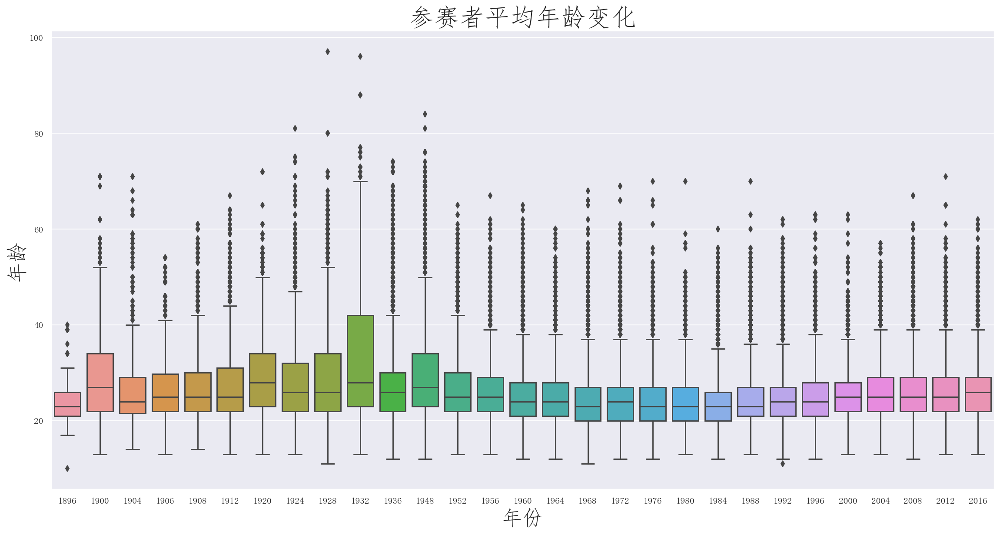

In [100]:
#筛选出年龄不为空的数据
age = data[np.isfinite(data['Age'])]
sns.set(style='darkgrid',font='FangSong')
plt.figure(figsize=(20,10))  #画布大小
sns.boxplot(x='Year',y='Age',data=age)
plt.xlabel('年份',fontsize=25)
plt.ylabel('年龄',fontsize=25)
plt.title('参赛者平均年龄变化',fontsize=30)   #显示出来
plt.show()

# （二）不同参赛国家各维度数据分析

## <span id="athlete">运动员人数变化</span>

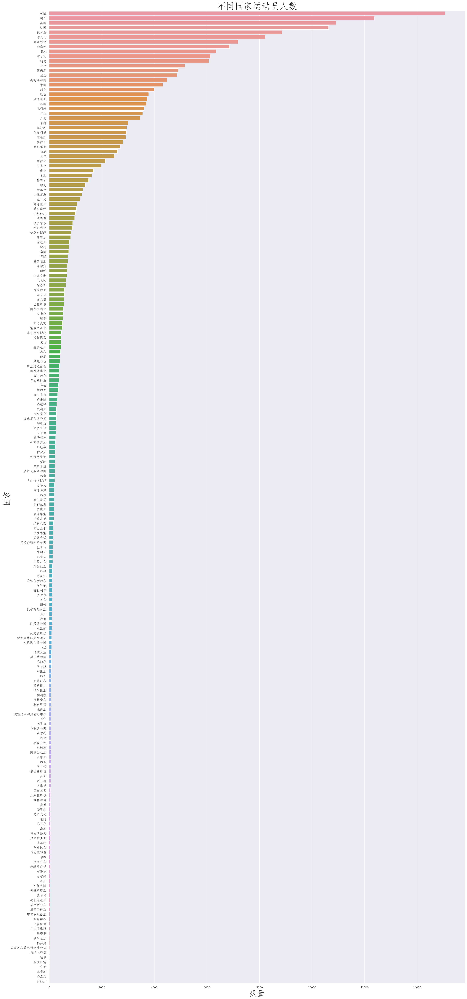

In [101]:
data_copy = data.copy()#data_copy为没有去重的data数据集，复制一份，以防遗漏了运动员人数
sns.set(style='darkgrid',font='FangSong')
plt.figure(figsize=(25,60))
sns.countplot(y='region',data=data_copy,order = data_copy['region'].value_counts().index)
rc = {'font.sans-serif': 'FangSong',
      'axes.unicode_minus': False}
sns.set(context='notebook', style='ticks', rc=rc)
plt.xlabel('数量',fontsize=25)
plt.ylabel('国家',fontsize=25)
plt.title('不同国家运动员人数',fontsize=30)
plt.show()

## <span id="medal">三种奖牌数（取参赛人数top20的国家）</span>

In [102]:
data_c = data.copy()
#统计金牌数
for i in range(1896,2017,4):
    for coun in ['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威']:
        tmp = data_c[(data_c['region']==coun)&(data_c['Year']==i)&(data_c['Medal']=='Gold')].Medal.value_counts()
        if tmp.empty:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_gold'] = 0
        else:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_gold'] = tmp[0]
#统计银牌数
for i in range(1896,2017,4):
    for coun in ['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威']:
        tmp = data_c[(data_c['region']==coun)&(data_c['Year']==i)&(data_c['Medal']=='Silver')].Medal.value_counts()
        if tmp.empty:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_silver'] = 0
        else:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_silver'] = tmp[0]
#统计铜牌数
for i in range(1896,2017,4):
    for coun in ['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威']:
        tmp = data_c[(data_c['region']==coun)&(data_c['Year']==i)&(data_c['Medal']=='Bronze')].Medal.value_counts()
        if tmp.empty:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_bronze'] = 0
        else:
            data_c.loc[((data_c.region==coun)&(data_c.Year==i)),'cnt_bronze'] = tmp[0]

In [103]:
#奖牌数去重
data_c = data_c.fillna(0)
data_c = data_c.drop_duplicates(subset = ['Year','Event','region'])
sub_ffp = data_c[data_c['region'].isin(['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威'])]

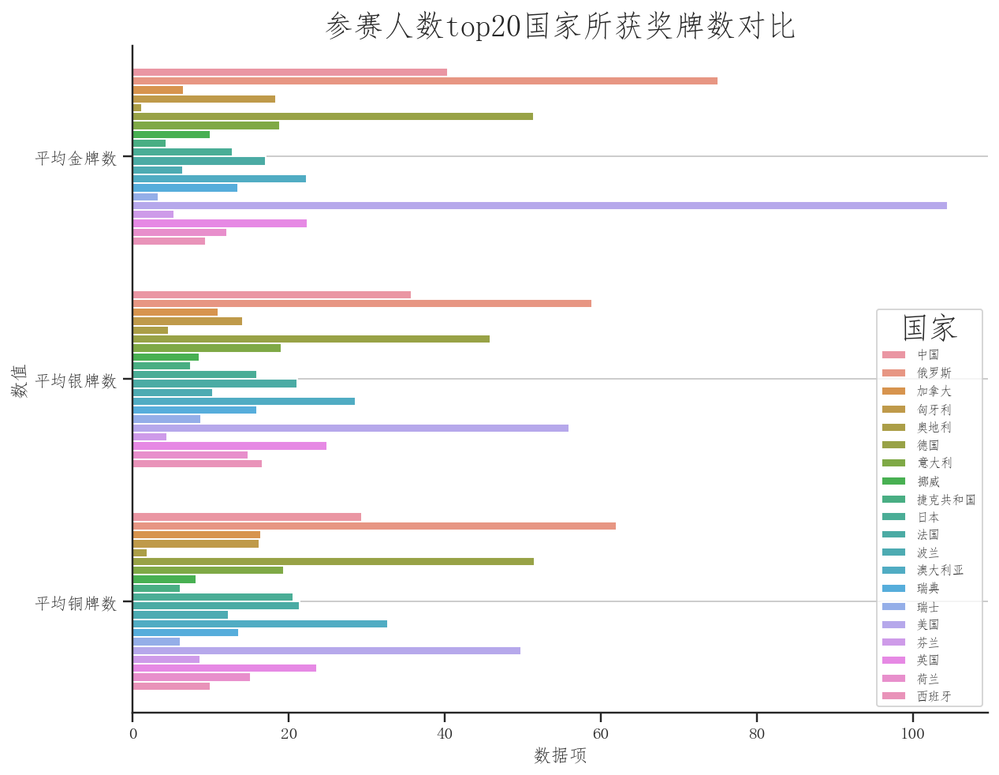

In [104]:
# 计算各个国家金银铜牌平均数据
sub_ffp_stats = sub_ffp.groupby('region')\
    .agg({'cnt_gold': 'mean','cnt_silver': 'mean','cnt_bronze':'mean'}).reset_index()

# 将宽数据转为长数据方便作图
sub_ffp_stats = sub_ffp_stats.melt(id_vars='region')
sub_ffp_stats.replace({'variable': {'cnt_gold': '平均金牌数','cnt_silver': '平均银牌数','cnt_bronze': '平均铜牌数'}}, inplace=True)
# print(sub_ffp_stats)
fig = plt.figure(figsize=(10, 8))
ax = fig.subplots()
sns.barplot(x='value', y='variable', hue='region', data=sub_ffp_stats)
sns.despine()
# 设置图例
lgd = ax.legend(loc='lower right', fancybox=True, prop={'size': 8}, title='国家')
plt.setp(lgd.get_title(),fontsize=20)
plt.grid(axis='y')
plt.xlabel('数据项')
plt.ylabel('数值')
plt.title('参赛人数top20国家所获奖牌数对比',size=20)
plt.show()

## <span id="comparison">参赛人数top30的国家金银铜牌总数对比</span>

In [105]:
result = {'country':[],'total':[]}

result['country'] = ['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威',
                     '韩国','罗马尼亚','比利时','巴西','丹麦','保加利亚','阿根廷','塞尔维亚','希腊','墨西哥']
#奖牌数去重
# data = data.drop_duplicates(subset = ['Year','Event','region'])
sub_ffp = data[data['region'].isin(['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威',
                     '韩国','罗马尼亚','比利时','巴西','丹麦','保加利亚','阿根廷','塞尔维亚','希腊','墨西哥'])]
sub_ffp = sub_ffp[(sub_ffp['Medal']=='Gold')|(sub_ffp['Medal']=='Silver')|(sub_ffp['Medal']=='Bronze')]
tmp = []
for coun in ['中国','俄罗斯','法国','德国','英国','美国','意大利','加拿大','日本','瑞典',
                 '澳大利亚','匈牙利','捷克共和国','波兰','瑞士','荷兰','芬兰','西班牙','奥地利','挪威',
                     '韩国','罗马尼亚','比利时','巴西','丹麦','保加利亚','阿根廷','塞尔维亚','希腊','墨西哥']:
    tmp1 = sub_ffp[(sub_ffp['region']==coun)]
    tmp.append(tmp1.Medal.value_counts().sum())
result['total'] = tmp

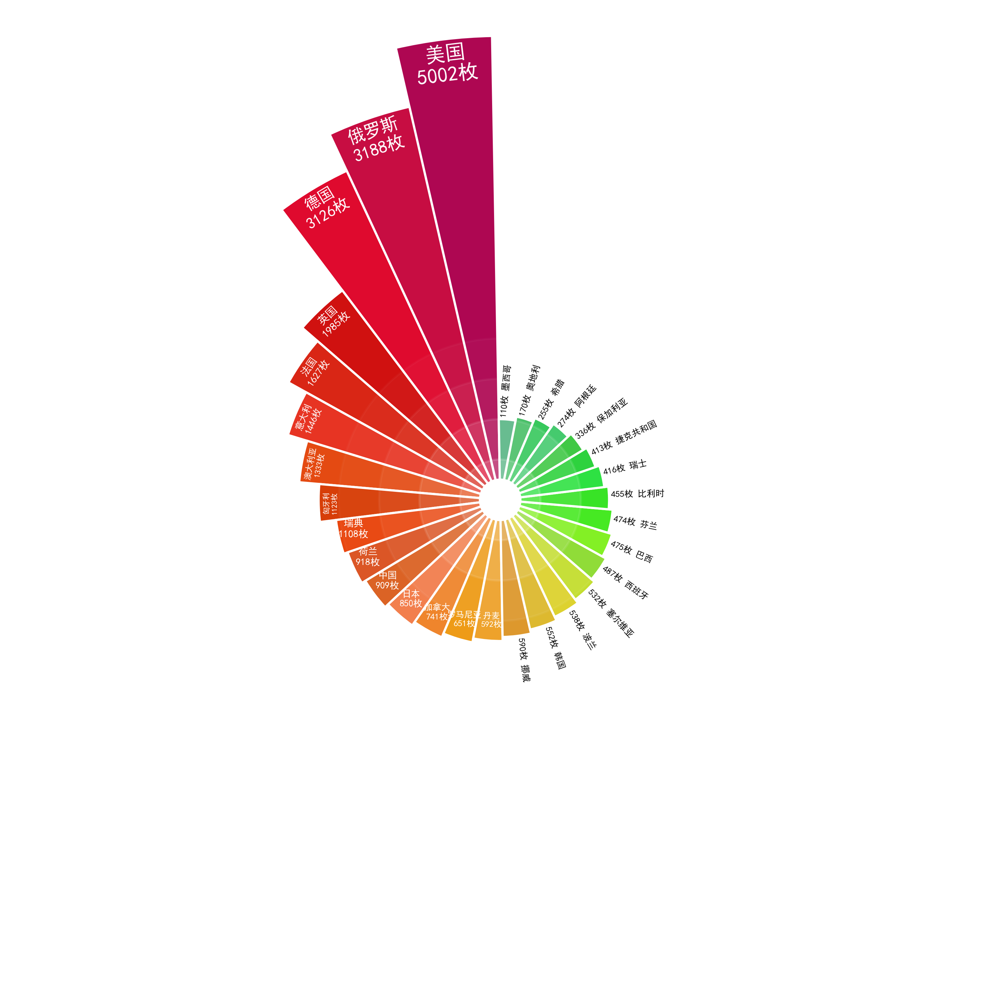

In [106]:
def rosetype_pie(country,confirmed,size,colors):
    plt.rcParams['font.sans-serif'] = ['SimHei']  # 中文显示

    num= len(size) # 柱子的数量
    width = 2 * np.pi / num # 每个柱子的宽度
    rad = np.cumsum([width] * num)  # 每个柱子的角度
    
    plt.figure(figsize=(8, 8),dpi=500,)  # 创建画布
    ax = plt.subplot(projection='polar')
    ax.set_ylim(-1, np.ceil(max(size) + 1))  # 中间空白,-1为空白半径大小，可自行调整
    ax.set_theta_zero_location('N',-5.0)  # 设置极坐标的起点方向 W,N,E,S, -5.0为偏离数值，可自行调整
    ax.set_theta_direction(1) # 1为逆时针，-1为顺时针
    ax.grid(False)  # 不显示极轴
    ax.spines['polar'].set_visible(False)  # 不显示极坐标最外的圆形
    ax.set_yticks([])  # 不显示坐标间隔
    ax.set_thetagrids([])  # 不显示极轴坐标

    ax.bar(rad, size, width=width, color=colors, alpha=1) # 画图
    ax.bar(rad, 1, width=width, color='white', alpha=0.15)  # 中间添加白色色彩使图案变浅
    ax.bar(rad, 3, width=width, color='white', alpha=0.1)  # 中间添加白色色彩使图案变浅
    ax.bar(rad, 5, width=width, color='white', alpha=0.05)  # 中间添加白色色彩使图案变浅
    ax.bar(rad, 7, width=width, color='white', alpha=0.03)  # 中间添加白色色彩使图案变浅

    # 设置text
    for i in np.arange(num):
        if i < 8:
            ax.text(rad[i],  # 角度
                    size[i]-0.2,  # 长度
                    country[i]+'\n'+str(confirmed[i])+ '枚',  # 文本
                    rotation=rad[i] * 180 / np.pi -5,  # 文字角度
                    rotation_mode='anchor',
                    # alpha=0.8,#透明度
                    fontstyle='normal',# 设置字体类型，可选参数[ ‘normal’ | ‘italic’ | ‘oblique’ ]，italic斜体，oblique倾斜
                    fontweight='black', # 设置字体粗细，可选参数 [‘light’, ‘normal’, ‘medium’, ‘semibold’, ‘bold’, ‘heavy’, ‘black’]
                    color='white', # 设置字体颜色
                    size=size[i]/2.4, # 设置字体大小
                    ha="center", # 'left','right','center'
                    va="top", # 'top', 'bottom', 'center', 'baseline', 'center_baseline'
                    )
        elif i < 15:
            ax.text(rad[i]+0.02,
                    size[i]-0.7,
                    country[i] + '\n' + str(confirmed[i]) + '枚',
                    fontstyle='normal',
                    fontweight='black',
                    color='white',
                    size=size[i] / 1.6,
                    ha="center",
                    )
        else:
            ax.text(rad[i],
                    size[i]+0.1,
                    str(confirmed[i]) + '枚 ' + country[i],
                    rotation=rad[i] * 180 / np.pi + 85,
                    rotation_mode='anchor',
                    fontstyle='normal',
                    fontweight='black',
                    color='black',
                    size=4,
                    ha="left",
                    va="bottom",
                    )

    plt.show()


if __name__ == '__main__':
    colors = [(0.68359375, 0.02734375, 0.3203125),
                    (0.78125, 0.05078125, 0.2578125),
                    (0.875, 0.0390625, 0.1796875),
                    (0.81640625, 0.06640625, 0.0625),
                    (0.8515625, 0.1484375, 0.08203125),
                    (0.90625, 0.203125, 0.13671875),
                    (0.89453125, 0.2890625, 0.0703125),
                    (0.84375, 0.2421875, 0.03125),
                    (0.9140625, 0.26953125, 0.05078125),
                    (0.85546875, 0.31640625, 0.125),
                    (0.85546875, 0.3671875, 0.1171875),
                    (0.94921875, 0.48046875, 0.28125),
                    (0.9375, 0.51171875, 0.1484375),
                    (0.93359375, 0.59765625, 0.0625),
                    (0.93359375, 0.62890625, 0.14453125),
                    (0.86328125, 0.5859375, 0.15234375),
                    (0.86328125, 0.71875, 0.16015625),
                    (0.86328125, 0.8203125, 0.16015625),
                    (0.76171875, 0.8671875, 0.16015625),
                    (0.53125, 0.85546875, 0.15625),
                    (0.4765625, 0.94140625, 0.0703125),
                    (0.21484375, 0.91015625, 0.0625),
                    (0.15234375, 0.88671875, 0.08203125),
                    (0.11328125, 0.87890625, 0.19921875),
                    (0.11328125, 0.8125, 0.1796875),
                    (0.1875, 0.76953125, 0.2109375),
                    (0.2109375, 0.78125, 0.38671875),
                    (0.1484375, 0.76953125, 0.30859375),
                    (0.22265625, 0.73046875, 0.35546875),
                    (0.2890625, 0.6875, 0.4765625)] # 转化为小数的rgb色列表，

    df = pd.DataFrame(columns=['country','total'])
    df.country = result['country']
    df.total = result['total']
    df=df.sort_values('total',ascending=False)
    country30 = df['country'].tolist()
    confirmed = df['total'].tolist()
    size = [22 ,19, 17, 12, 11, 10, 9, 8, 7.2, 7.0,
            6.8, 6.6, 6.4, 6.2, 6.0, 5.8, 5.6, 5.4, 5.2, 5.0, 4.8, 4.6, 4.4, 4.2, 4.0, 3.8, 3.6, 3.4, 3.2, 3.0] # 自定义一个柱长度列
    rosetype_pie(country30, confirmed, size, colors)



## <span id="top20">奥运金牌总榜top20国家排序</span>

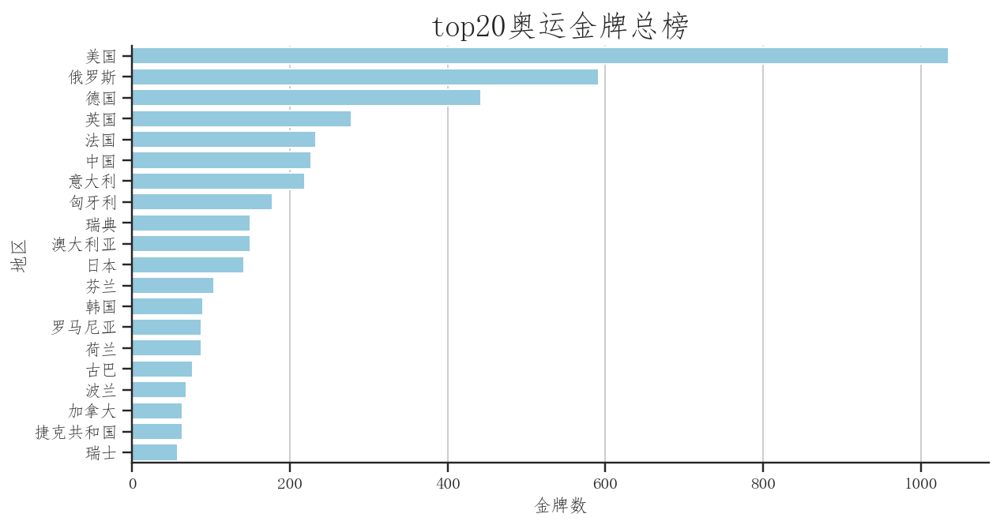

In [107]:
_rebuild()
matplotlib.rcParams['font.family']=['FangSong']
matplotlib.rcParams['axes.unicode_minus'] = False
%matplotlib inline
plt.rcParams['figure.figsize'] = [16,10]
plt.rcParams['figure.dpi'] = 140
plt.rcParams['font.size'] = 20

gold_data = data[(data['Medal']=='Gold')]
# 去除多人项目的重复金牌数
gold = gold_data.drop_duplicates(subset=['Year','Event','NOC'])
# gold[(gold['region']=='China')&(gold['Year']==2008)].Medal.count()
# 计算出历史上所有国家及地区的金牌总数并取top20
top20 = gold['region'].value_counts()[:20]
top20 = top20.reset_index()
top20.columns = ['region','count']

# 绘制top20奥运金牌总榜
plt.figure(figsize=(10, 5))
sns.barplot(x='count',  y='region', data=top20, color='skyblue') 
sns.despine()

plt.grid(axis='x')
plt.xlabel('金牌数')
plt.ylabel('地区')
plt.title('top20奥运金牌总榜',fontsize=20)

plt.show()

## <span id="gold">主场效应-近9届奥运会东道主金牌表现</span>

In [108]:
gold = data[(data.Medal=='Gold')&((data.region=='中国')|(data.region=='俄罗斯')|
            (data.region=='韩国')|(data.region=='西班牙')|(data.region=='澳大利亚')|
            (data.region=='美国')|(data.region=='希腊')|(data.region=='英国'))]#筛选出中国和其他五大强国
#根据年份升序排列
gold=gold.sort_values(by="Year",ascending=True)
#gold里统计金牌数列为空的全部补0
gold = gold.fillna(0)
#奖牌数去重
gold = gold.drop_duplicates(subset = ['Year','Event','region'])

In [109]:
my_count = ["俄罗斯","美国（洛杉矶）","韩国","西班牙","美国（亚特兰大）",
            "澳大利亚","希腊","中国","英国"]
gold_num = []
for i in range(1976,1985,4):
    tmp = gold[(gold['region']=='俄罗斯')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(1980,1989,4):
    tmp = gold[(gold['region']=='美国')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(1984,1993,4):
    tmp = gold[(gold['region']=='韩国')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(1988,1997,4):
    tmp = gold[(gold['region']=='西班牙')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(1992,2001,4):
    tmp = gold[(gold['region']=='美国')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(1996,2005,4):
    tmp = gold[(gold['region']=='澳大利亚')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(2000,2009,4):
    tmp = gold[(gold['region']=='希腊')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(2004,2013,4):
    tmp = gold[(gold['region']=='中国')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])
for i in range(2008,2017,4):
    tmp = gold[(gold['region']=='英国')&(gold['Year']==i)].Medal.value_counts()
    if tmp.empty:
        gold_num.append(0)
    else:
        gold_num.append(tmp[0])

In [110]:
text = ["上一届","本届","下一届","上一届","本届","下一届","上一届","本届","下一届","上一届","本届","下一届",
       "上一届","本届","下一届","上一届","本届","下一届","上一届","本届","下一届","上一届","本届","下一届","上一届","本届","下一届"]
# year = [1976,"1980,Moskva",1984,1980,"1984,Los Angeles",1988,1984,"1988,Seoul",1992,1988,"1992,Barcelona",1996,
#         1992,"1996,Atlanta",2000,1996,"2000,Sydney",2004,2000,"2004,Athina",2008,
#         2004,"2008,Beijing",2012,2008,"2012,London",2016]
year = ["","1980,莫斯科","","","1984,洛杉矶","","","1988,首尔","","","1992,巴塞罗那","",
        "","1996,亚特兰大","","","2000,悉尼","","","2004,雅典","",
        "","2008,北京","","","2012,伦敦",""]
df = pd.DataFrame({
    "国家":np.repeat(my_count, 3),
    "近三届奥运会":text,
    "金牌数":gold_num,
    "年":year
})

In [111]:
#增加注解
def annotate_points(x,y,t, **kwargs):
    ax = plt.gca()
    data = kwargs.pop('data')
    for i,row in data.iterrows():
        ax.annotate(row[t], xy=(row[x],row[y]),size=10,
                    # 设置文字框属性
                    bbox={'boxstyle': 'round,pad=0.3', 'fc': 'y', 'alpha': 0.33})

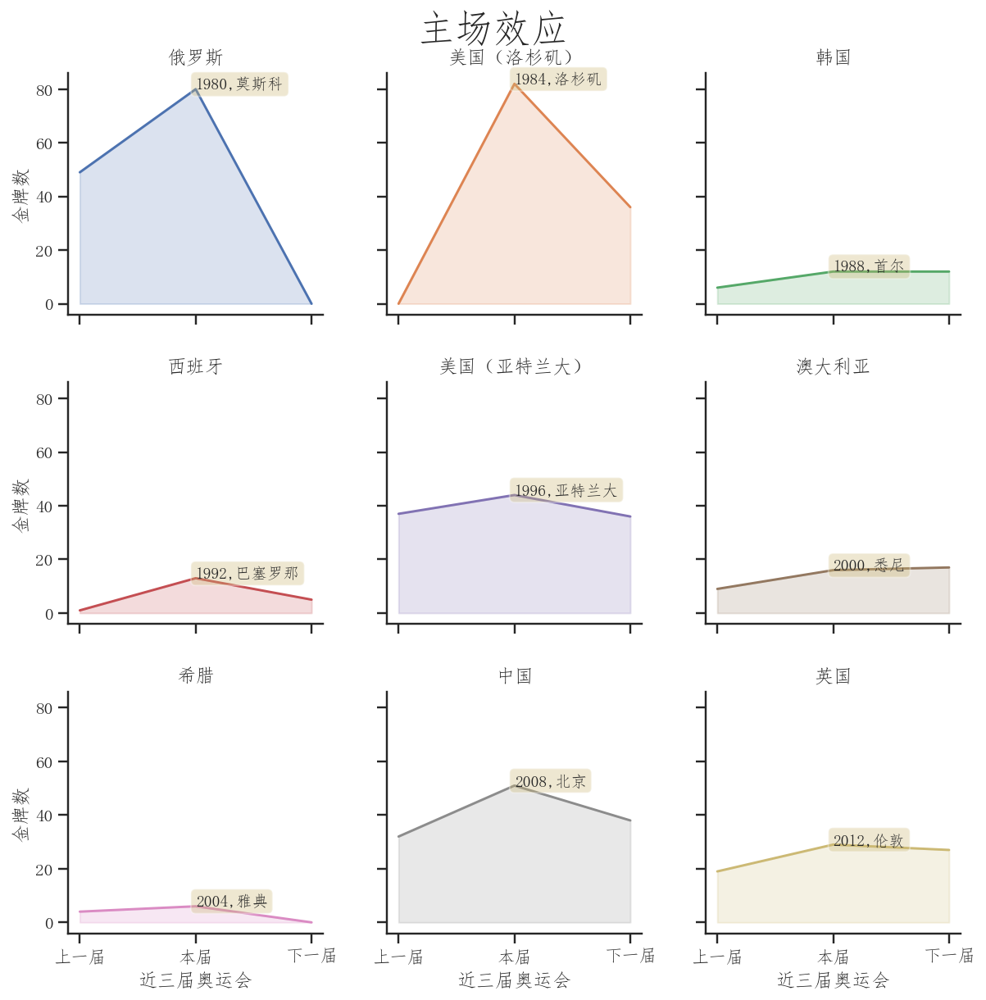

In [112]:
# Create a grid : initialize it
g = sns.FacetGrid(df, col='国家', hue='国家', col_wrap=3, )
# Add the line over the area with the plot function
g = g.map(plt.plot, '近三届奥运会', '金牌数')
# Fill the area with fill_between
g = g.map(plt.fill_between, '近三届奥运会', '金牌数', alpha=0.2).set_titles("{col_name} Country")
g.map_dataframe(annotate_points, "近三届奥运会", "金牌数", '年')
# Control the title of each facet
g = g.set_titles("{col_name}")
# Add a title for the whole plot
plt.subplots_adjust(top=0.92)
g = g.fig.suptitle('主场效应')
# Show the graph
plt.show()

## <span id="top50">参赛人数总和top50国家排序</span>

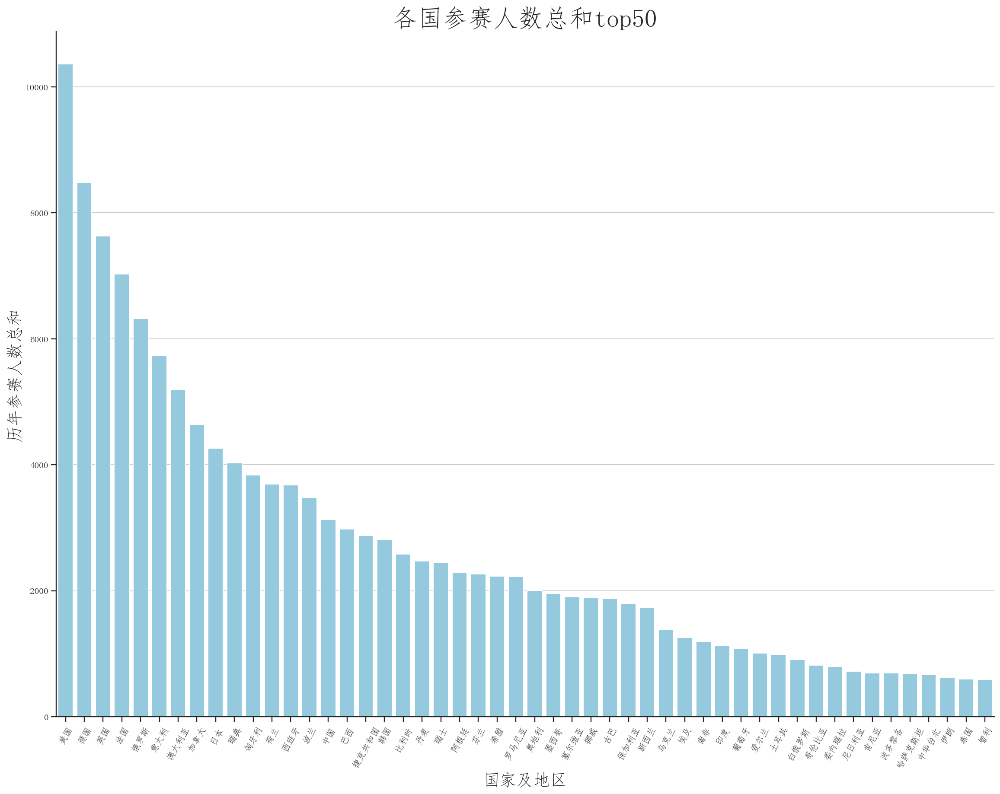

In [113]:
# 去除重复项目的人数
athlete = data.drop_duplicates(subset=['Year','ID'])
# 计算出历史上所有国家及地区的参赛人数并取top50
top50 = athlete['region'].value_counts()[:50]
top50 = top50.reset_index()
top50.columns = ['region','count']

# 绘制各国参赛人数总和top50
plt.figure(figsize=(20, 15))
sns.barplot(x='region',  y='count', data=top50, color='skyblue') 
sns.despine()
plt.xticks(rotation=60)
plt.grid(axis='y')
plt.xlabel('国家及地区',fontsize=20)
plt.ylabel('历年参赛人数总和',fontsize=20)
plt.title('各国参赛人数总和top50',fontsize=30)
plt.show()

## <span id="city">依据历届奥运会举办次数排序的各大城市</span>

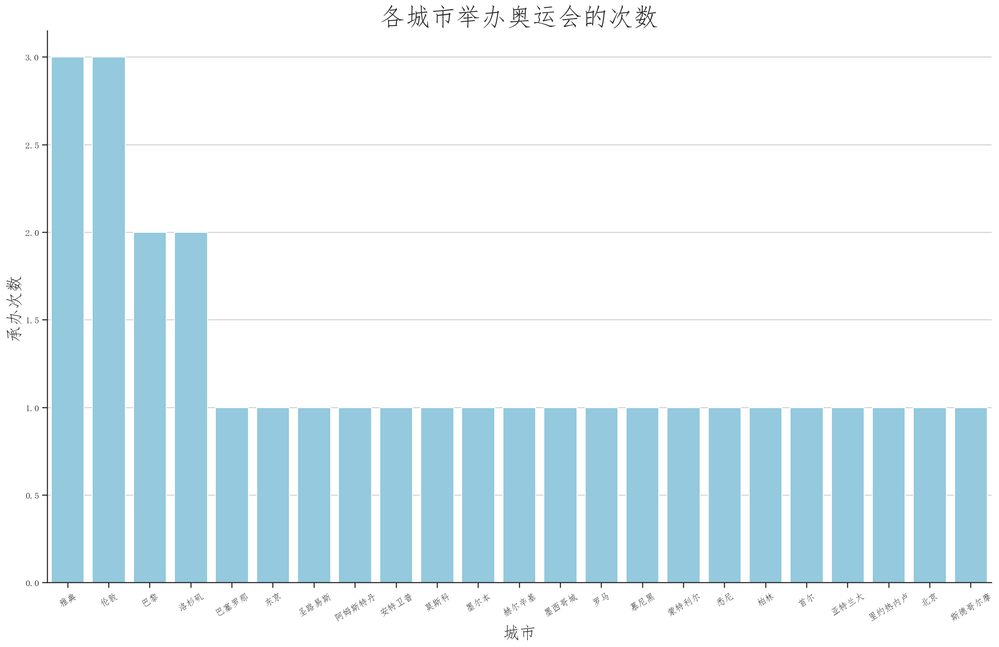

In [114]:
city = data.drop_duplicates(subset=['Year','City'])
# 计算出举办奥运会的城市次数
city = city['City'].value_counts()
city = city.reset_index()
city.columns = ['city','count']

# 绘制举办奥运会的城市次数
plt.figure(figsize=(20, 12))
sns.barplot(x='city', y='count', data=city, color='skyblue') 
sns.despine()
plt.xticks(rotation=30)
plt.grid(axis='y')
plt.xlabel('城市',fontsize=20)
plt.ylabel('承办次数',fontsize=20)
plt.title('各城市举办奥运会的次数',fontsize=30)
# plt.savefig('各城市举办奥运会的次数.png')
plt.show()

## <span id="map">绘制历年夏季奥运会各国奖牌获得情况</span>

In [115]:
tl = Timeline(init_opts=opts.InitOpts(width='720px', height='350px'))
df = data.copy()
df1 = df.replace('UK','United Kingdom')
df1 = df1.replace('USA','United States')
# df1 = df1.drop_duplicates(subset = ['Year','Event','region'])
# df1 = df1.drop_duplicates(subset = ['Year','Event','region','Sport'])

gold = df1[df1['Medal']=='Gold']
silver = df1[df1['Medal']=='Silver']
bronze = df1[df1['Medal']=='Bronze']

gold = gold.drop_duplicates(subset = ['Year','Event','region_Eng'])
silver = silver.drop_duplicates(subset = ['Year','Event','region_Eng'])
bronze = bronze.drop_duplicates(subset = ['Year','Event','region_Eng'])

country_stats_g = gold.groupby(['Year', 'region_Eng'])['Medal'].count().reset_index()
country_stats_s = silver.groupby(['Year', 'region_Eng'])['Medal'].count().reset_index()
country_stats_b = bronze.groupby(['Year', 'region_Eng'])['Medal'].count().reset_index()
# country_stats_g.head()

c_g = pd.pivot(country_stats_g, index='Year', columns='region_Eng').droplevel(0,axis=1).reset_index()
c_g = c_g.fillna(0)
c_s = pd.pivot(country_stats_s, index='Year', columns='region_Eng').droplevel(0,axis=1).reset_index()
c_s = c_s.fillna(0)
c_b = pd.pivot(country_stats_b, index='Year', columns='region_Eng').droplevel(0,axis=1).reset_index()
c_b = c_b.fillna(0)

c1 = c_g.columns[2:]
c2 = c_s.columns[2:]
c3 = c_b.columns[2:]

year1 = list(c_g['Year'])
year2 = list(c_s['Year'])
year3 = list(c_b['Year'])


flow1=[]
flow2=[]
flow3=[]

for i in range(len(year1)):
    flow1.append([])
    for j in range(len(c1)):
        flow1[i].append(list(c_g[c1[j]])[i]) 
        
for i in range(len(year2)):
    flow2.append([])
    for j in range(len(c2)):
        flow2[i].append(list(c_s[c2[j]])[i]) 
        
for i in range(len(year3)):
    flow3.append([])
    for j in range(len(c3)):
        flow3[i].append(list(c_b[c3[j]])[i]) 


for i in range(len(year1)):
    
    map0 = (
        Map()
        .add("金牌", [list(z) for z in zip(c1, flow1[i])], "world", is_map_symbol_show=False)
        .add("银牌", [list(z) for z in zip(c2, flow2[i])], "world", is_map_symbol_show=False)
        .add("铜牌", [list(z) for z in zip(c3, flow3[i])], "world", is_map_symbol_show=False)
        .set_series_opts(label_opts=opts.LabelOpts(is_show=False))
        .set_global_opts(
            title_opts=opts.TitleOpts(title=" {} 年夏季奥运会各国奖牌数量".format(year1[i])),
            legend_opts=opts.LegendOpts(pos_right='right'),
            visualmap_opts=opts.VisualMapOpts(max_=200),
        )
    )
    tl.add(map0, "{} 年".format(year1[i]))

tl.render_notebook()


## <span id="circle">中国&体育强国奥运金牌男女项目比例汇总</span>

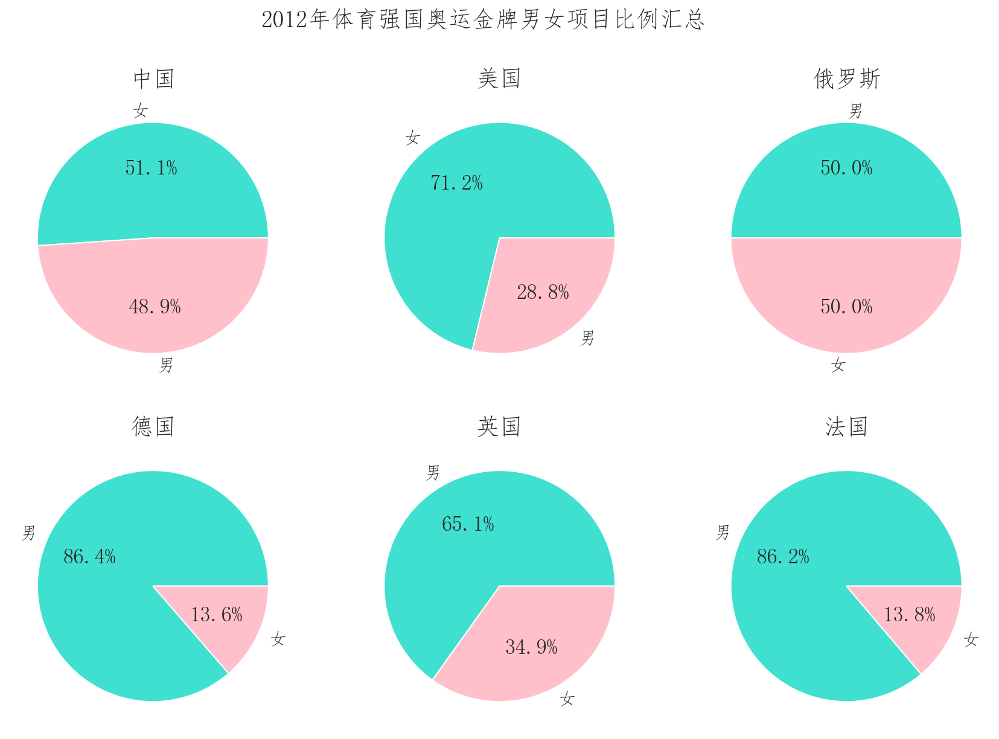

In [138]:
# 按国家进行统计
gold = data[(data['Medal']=='Gold')&(data['Year']==2012)].copy()

gold['sex_n'] = gold.apply(lambda gold : 2 if gold['Sex'] == 'F' else 0, axis = 1)


#print(gold)
country_stats = gold.groupby('region')['Medal'].count().reset_index()
country_stats = country_stats.sort_values(by='Medal', ascending=False).reset_index()#选取前六个国家
country_stats.head(6)

e_region = ['中国','美国', '俄罗斯', '德国', '英国', '法国']
stats_e = gold[gold['region'].isin(e_region)]
stats_e = stats_e.groupby(['Name','sex_n','region'])['Medal'].count().reset_index()
stats_e.head(20)

plt.subplots(figsize=(15, 10))
i = 1

for item in e_region:
    stats = stats_e[stats_e['region']==item]
    cuts = pd.cut(stats['sex_n'], bins=[-1, 1, 3], labels=['男', '女'])
    cuts_stats = cuts.value_counts()
    plt.subplot(2,3,i) 
    patches, texts, autotexts = plt.pie(cuts_stats, labels=cuts_stats.index, autopct='%1.1f%%',colors=['turquoise','pink'])
    plt.title(item, size=20) 
    plt.setp(autotexts, size=18)
    plt.setp(texts, size=15)
    i += 1

# plt.suptitle("体育强国奥运金牌男女项目比例汇总", size=20)
plt.suptitle("2012年体育强国奥运金牌男女项目比例汇总", size=20)

plt.show()

## <span id="nianling">中国&体育强国金牌运动员年龄分布对比</span>

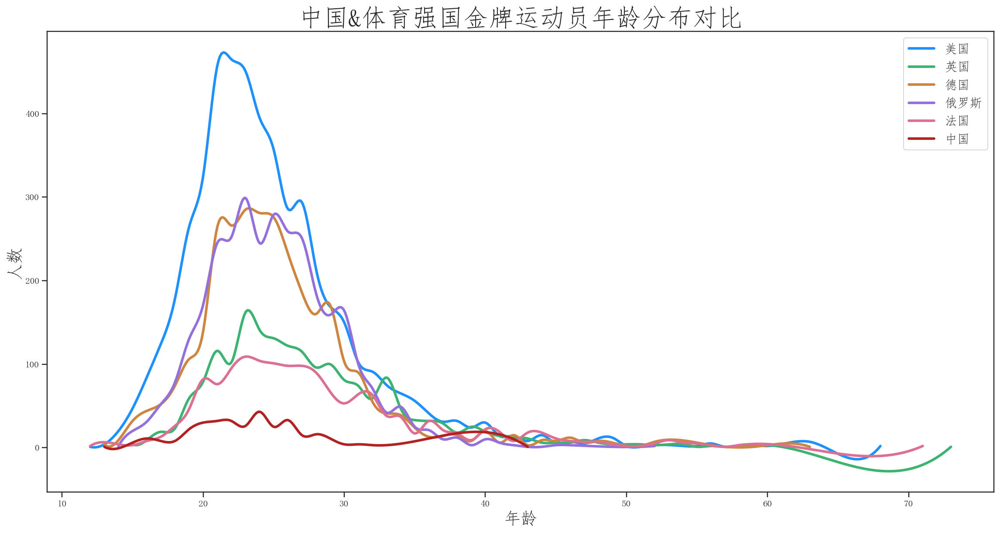

In [117]:
# 保留中国获奖的选手并去除重复
tmp = data[(data['Medal']=='Gold')&(data['region']=='中国')|(data['region']=='美国')|(data['region']=='英国')|
           (data['region']=='德国')|(data['region']=='俄罗斯')|(data['region']=='法国')]
tmp = tmp.astype({'Medal':'str'})
nan_index = tmp[(tmp['Medal'] =='nan')].index.tolist()
tmp = tmp.drop(index=nan_index)
# medalist = tmp.drop_duplicates(subset=['Year','Event','ID'])
# 计算各奖牌各年龄选手有多少
medalist = pd.DataFrame({'Count':tmp.groupby( ['Age','region'] ).size()}).reset_index()

# 绘制获奖选手的夺牌率分布图
plt.figure(figsize=(20, 10))
# x = np.array(age_list)
for coun,color in zip(['美国','英国','德国','俄罗斯','法国','中国'],['dodgerblue','mediumseagreen','peru','mediumpurple','palevioletred','firebrick']):
    tmp = medalist[medalist['region']==coun]
    # 计算各奖牌各年龄选手有多少
    tmp_age = tmp.drop_duplicates(subset=['Age']).Age.tolist()
    x = np.array(tmp_age)
    y = np.array(medalist[(medalist['region']==coun)].Count.tolist())
#     xs = np.linspace(tmp_age[0],tmp_age[-1],31)
    model = make_interp_spline(x, y)
    xs = np.linspace(tmp_age[0],tmp_age[-1],500)
    ys = model(xs)
    plt.plot(xs, ys, c=color,label=coun,linewidth='3')
plt.title('中国&体育强国金牌运动员年龄分布对比',fontsize=30)
plt.xlabel('年龄',fontsize=20)
plt.ylabel('人数',fontsize=20)
plt.legend(loc="upper right",fontsize=15)
# ylim(0,0.2)
plt.show()

## <span id="duopai">21世纪体育强国夺牌率</span>

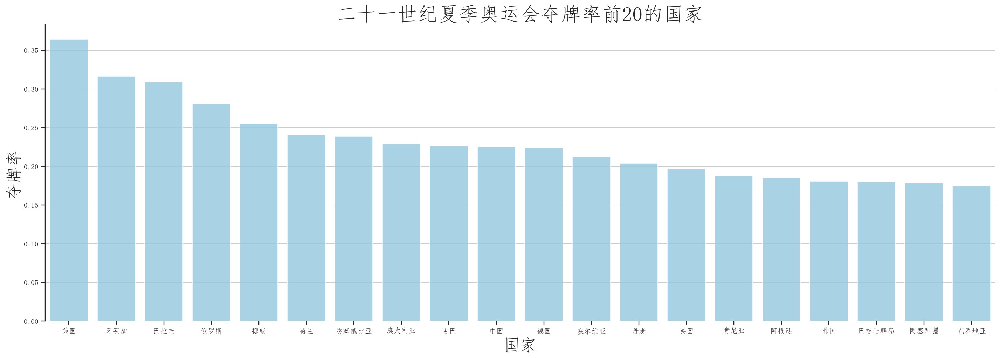

In [140]:
df = data.copy()
df['medal_n'] = df.apply(lambda df : 1 if df['Medal'] == 'Gold' or df['Medal'] == 'Silver' or df['Medal'] == 'Bronze' else 0, axis = 1)
recent = df[df['Year']>1999]

medal = recent.groupby('region')['medal_n'].sum().reset_index()

num = recent.groupby('region')['Name'].count().reset_index().rename(columns={'Name':'athlete_num'}) # 各国参赛人数
num.head(20)

re = pd.merge(medal,num,how='inner',on='region')
re['ratio'] = re['medal_n']/re['athlete_num']
re = re.sort_values(by='ratio', ascending=False).reset_index()#排序，方便选取奖牌数最多的前20个国家
re = re[:20]

plt.figure(figsize=(25, 8))
sns.barplot(x='region', y='ratio', data=re,color='skyblue', alpha=0.8)

# 同时去掉底部边框
sns.despine(bottom=True)
plt.grid(axis='y')
plt.xlabel('国家',fontsize=25)
plt.ylabel('夺牌率',fontsize=25)
plt.title('二十一世纪夏季奥运会夺牌率前20的国家',fontsize=30)
plt.show()


# 二、中国体育新征程

## <span id="china">中国奥运征程（中国金牌数变化趋势+和金牌榜top5的对比）</span>

In [119]:
gold = data[(data.Medal=='Gold')&((data.region=='中国')|(data.region=='俄罗斯')|
            (data.region=='法国')|(data.region=='德国')|(data.region=='英国')|
            (data.region=='美国'))]#筛选出中国和其他五大强国
X = []
for i in range(1896,2017,4):
    for coun in ['中国','俄罗斯','法国','德国','英国','美国']:
        tmp = gold[(gold['region']==coun)&(gold['Year']==i)].Medal.value_counts()
        if tmp.empty:
            gold.loc[((gold.region==coun)&(gold.Year==i)),'cnt_gold'] = 0
#             gold[(gold['region']==coun)]['cnt_gold'] = 0
        else:
            gold.loc[((gold.region==coun)&(gold.Year==i)),'cnt_gold'] = tmp[0]

In [120]:
#根据年份升序排列
gold=gold.sort_values(by="Year",ascending=True)
#gold里统计金牌数列为空的全部补0
gold = gold.fillna(0)

In [121]:
#奖牌数去重
gold = gold.drop_duplicates(subset = ['Year','Event','region'])

In [122]:
gold1 = pd.DataFrame(np.arange(1896,2017,4))
gold1.columns = ['年份']
gold1[['中国','俄罗斯','法国','德国','英国','美国']]=0
for i in range(1896,2017,4):
    for coun in ['中国','俄罗斯','法国','德国','英国','美国']:
        tmp = gold[(gold['region']==coun)&(gold['Year']==i)].Medal.value_counts()
        tmp1 = gold1.loc[gold1['年份']==i].index[0]
        if tmp.empty:
            gold1.loc[tmp1,coun] = 0
        else:
            gold1.loc[tmp1,coun] = tmp[0]

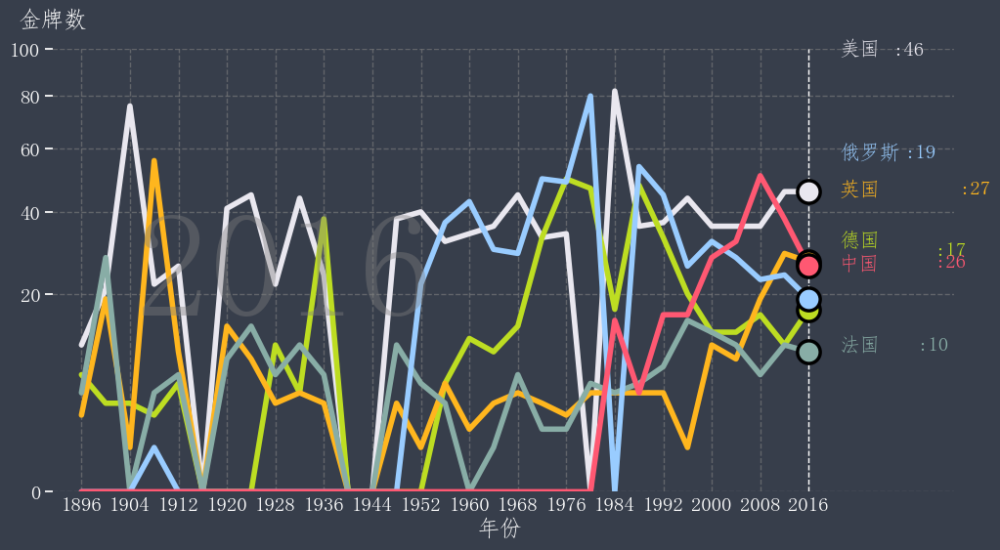

In [123]:
plt.rcParams['font.family'] = ['FangSong']
plt.rcParams['animation.embed_limit'] = 2**64
# current_year = 2016
fig, ax = plt.subplots(figsize=(12,6),dpi = 100,facecolor='#373E4B',edgecolor='#373E4B')
ax.set_facecolor('#373E4B')

def line_animation(current_year):
    data_test = gold1.loc[gold1.年份<=current_year,:]
    idx = data_test.年份
    
    ax.clear( )
    #USA
    ax.plot(idx,data_test['美国'],color='#e9e7ef',lw=4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['美国'].tolist()[-1],color='#e9e7ef',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['美国'].tolist()[-1]+50,'美国',size=15,c='#e9e7ef',
            va='bottom',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+14,data_test['美国'].tolist()[-1]+50,
            ':{:,.0f}'.format(data_test['美国'].tolist()[-1]),
            c='#e9e7ef',size=15,fontweight='bold',ha='left',va='bottom')#数值
    #Germany
    ax.plot(idx,data_test['德国'],color='#bddd22',lw=4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['德国'].tolist()[-1],color='#bddd22',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['德国'].tolist()[-1]+13,'德国',size=15,c='#bddd22',
            va='bottom',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+21,data_test['德国'].tolist()[-1]+13,
            ':{:,.0f}'.format(data_test['德国'].tolist()[-1]),
            c='#bddd22',size=15,fontweight='bold',ha='left',va='center')#数值
    #UK
    ax.plot(idx,data_test['英国'],color='#ffb61e',lw=4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['英国'].tolist()[-1],color='#ffb61e',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['英国'].tolist()[-1]+20,'英国',size=15,c='#ffb61e',
            va='center',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+25,data_test['英国'].tolist()[-1]+20,
            ':{:,.0f}'.format(data_test['英国'].tolist()[-1]),
            c='#ffb61e',size=15,fontweight='bold',ha='left',va='center')#数值
    #France
    ax.plot(idx,data_test['法国'],color='#88ada6',lw=4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['法国'].tolist()[-1],color='#88ada6',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['法国'].tolist()[-1]+1,'法国',size=15,c='#88ada6',
            va='center',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+18,data_test['法国'].tolist()[-1]+1,
            ':{:,.0f}'.format(data_test['法国'].tolist()[-1]),
            c='#88ada6',size=15,fontweight='bold',ha='left',va='center')#数值
    #Russia
    ax.plot(idx,data_test['俄罗斯'],color='#99CCFF',lw=4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['俄罗斯'].tolist()[-1],color='#99CCFF',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['俄罗斯'].tolist()[-1]+40,'俄罗斯',size=15,c='#99CCFF',
            va='center',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+16,data_test['俄罗斯'].tolist()[-1]+40,
            ':{:,.0f}'.format(data_test['俄罗斯'].tolist()[-1]),
            c='#99CCFF',size=15,fontweight='bold',ha='left',va='center')#数值
    #China
    ax.plot(idx, data_test['中国'],color = '#FF5872',lw = 4)#折线图
    ax.scatter(idx.tolist()[-1],data_test['中国'].tolist()[-1],color='#FF5872',
               edgecolor = 'black',s = 280,lw = 2.5,zorder =4)#散点图
    ax.text(idx.tolist()[-1]+5,data_test['中国'].tolist()[-1]+3,'中国',size=15,c='#FF5872',
            va='top',ha='left',fontweight='bold')#国家A
    ax.text(idx.tolist()[-1]+21,data_test['中国'].tolist()[-1]+3,
            ':{:,.0f}'.format(data_test['中国'].tolist()[-1]),
            c='#FF5872',size=15,fontweight='bold',ha='left',va='top')#数值
    
    #添加一条推进线
    ax.axvline(idx.tolist()[-1],ls="--",color='white',lw=1)
    #设置轴、刻度等属性
    ax.spines['top' ].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#373E4B')
    ax.spines['bottom'].set_color('#373E4B')
    ax.tick_params(bottom = False,labelsize = 15,direction = 'in' ,colors = 'white')
    ax.set_xticks(np.arange(1896,2017,8))
    #固定轴刻度
    ax.set_xlim(left=1890, right=2040)
    ax.set_ylim(ymin=0,ymax=100)
    ax.set_xlabel('年份',color='white',fontsize=17)
    #自定义刻度轴范围scale函数
    def forward(x):
        return x**(1/2)
    def inverse(x):
        return x**1
    ax.set_yscale('function',functions=(forward,inverse))
    ax.grid(axis="both",color='gray',lw=1,alpha=.6,ls='--')
    #修改刻度形式Formatter
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    #添加年份
    ax.text(.1,.4,idx.tolist()[-1],transform = ax.transAxes,color = 'gray',alpha = .4,size = 110,
            fontfamily = "FangSong")
    ax.text(-0.03,1.05,'金牌数',transform = ax.transAxes,color='white',size=17)
    
    ax.set_axisbelow(True)
    plt.box(False)
    
line_animator = animation.FuncAnimation(fig,line_animation,frames=np.arange(1896,2017,4),
                                        interval=200)
HTML(line_animator.to_jshtml())


## <span id="CHistory">中国奥运奖牌历史趋势</span>

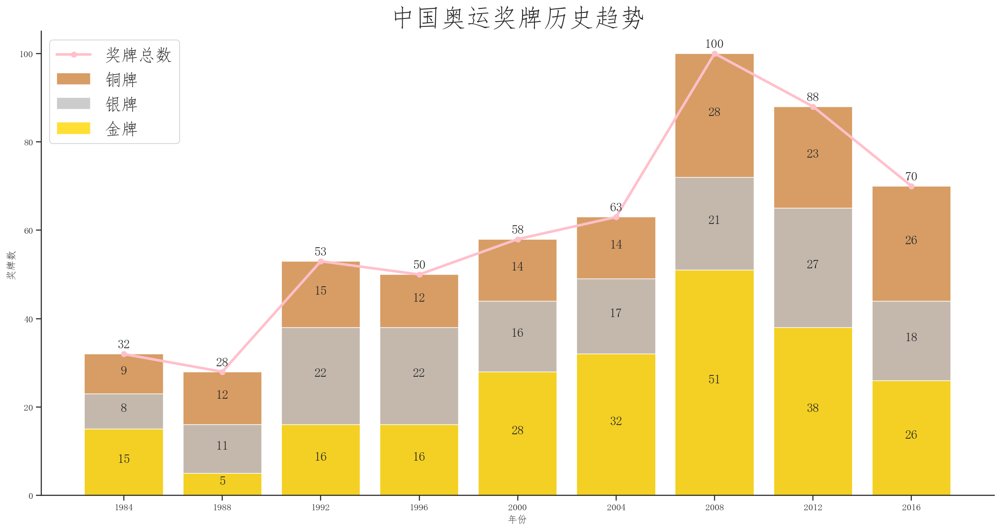

In [124]:
# 保留中国获奖牌数并去除重复
tmp = data[data['region']=='中国']
tmp = tmp.astype({'Medal':'str'})
nan_index = tmp[(tmp['Medal'] =='nan')].index.tolist()
tmp = tmp.drop(index=nan_index)
tmp = tmp.drop_duplicates(subset=['Year','Event','Medal'])
tmp = tmp[tmp['Year'].isin([1984,1988,1992,1996,2000,2004,2008,2012,2016])]
china = pd.DataFrame({'Count':tmp.groupby( ['Year', 'Medal'] ).size()}).reset_index()
# 准备数据
x = ['1984','1988','1992','1996','2000','2004','2008','2012','2016']
gold = china[china['Medal']=='Gold'].Count.tolist()
silver = china[china['Medal']=='Silver'].Count.tolist()
bronze = china[china['Medal']=='Bronze'].Count.tolist()
barg = gold
bars = [i+j for i,j in zip(gold,silver)]
barb = [i+j+k for i,j,k in zip(gold,silver,bronze)]

plt.figure(figsize=(20, 10))
# 柱状图
plt.bar(x=x, height=barb, label='铜牌', color='peru', alpha=0.8)
plt.bar(x=x, height=bars, label='银牌', color='silver', alpha=0.8)
plt.bar(x=x, height=barg, label='金牌', color='gold', alpha=0.8)

# 标记柱状图上的奖牌数量
for index,row in zip(x, zip(gold,silver,bronze)):
    height = 0
    val=0 #标记点的纵坐标
    for i in range(3):
        val+=height/2+row[i]/2 #实现标记在柱子的中央
        height=row[i]
        vals=row[i]
        plt.text(index,val,vals,horizontalalignment='center',fontsize=15)

# 折线图
plt.plot(x, barb, marker='o', c='pink', linewidth='3', label="奖牌总数")
# 显示总奖牌数量
for a, b in zip(x, barb):
    plt.text(a, b+1, b, ha='center', va='bottom', fontsize=15)

sns.despine()
# plt.grid(axis='y')
plt.title('中国奥运奖牌历史趋势',fontsize=30)
plt.xlabel('年份')
plt.ylabel('奖牌数')
plt.legend(loc="upper left",fontsize=20)
plt.show()

## <span id="tree">中国历届夏季奥运会奖牌数</span>

In [125]:
dic = {
 '2016年': ('China', 26, 18, 26),
 '2012年': ('China', 38, 27, 24),
 '2008年': ('China', 51, 21, 28),
 '2004年': ('China', 32, 18, 14),
 '2000年': ('China', 28, 16, 14),
 '1996年': ('China', 17, 22, 12),
 '1992年': ('China', 16, 22, 15),
 '1988年': ('China', 5, 11, 12),
 '1984年': ('China', 15, 8, 9)}
#设置颜色样式、节点线条样式
color_js = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#696969'}, {offset: 1, color: '#ed1941'}], false)"""
color_js0 = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#696969'}, {offset: 1, color: '#FFD700'}], false)"""
color_js1 = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#696969'}, {offset: 1, color: '#C0C0C0'}], false)"""
color_js2 = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#696969'}, {offset: 1, color: '#8B4513'}], false)"""
color_js3 = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#FFFF00'}, {offset: 1, color: '#FF0000'}], false)"""
color_js4 = """new echarts.graphic.LinearGradient(0, 0, 1, 0,
    [{offset: 0, color: '#FFF0F5'}, {offset: 1, color: '#1E90FF'}], false)"""

color_function = """
        function (params) {
            if (params.name == '金牌') {
                return '#FFD700';
            } else if (params.name == '银牌') {
                return '#C0C0C0';
            }
            return '#8B4513';
        }
        """
width = 1.5
curveness = 0.9
itemStyle1={'color':JsCode(color_js0)}
itemStyle2={'color':JsCode(color_js1)}
itemStyle3={'color':JsCode(color_js2)}

one_level_style = {'color':JsCode(color_js),'width': width, 'curveness': curveness, 'type': 'solid'}
gold_style = {'color':JsCode(color_js0),'width': width, 'curveness': curveness, 'type': 'solid'}
silver_style = {'color':JsCode(color_js1),'width': width, 'curveness': curveness, 'type': 'solid'}
bronze_style = {'color':JsCode(color_js2),'width': width, 'curveness': curveness, 'type': 'solid'}

In [126]:
#构造父子数据
tree_data = [{
    "name": "",
    'symbolSize':'15',
    'itemStyle':{
            'color': JsCode(color_js3),
            'borderWidth':2,
            'opacity':0.9
    } ,
    "children": [
        {
            "name": "1984年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 15,'itemStyle':itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 8,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 9,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
                {
            "name": "1988年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 5,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 11,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 12,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
        {
            "name": "1992年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 16,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 22,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 15,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
                {
            "name": "1996年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 17,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 22,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 12,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
                {
            "name": "2000年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 28,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 16,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 14,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
                {
            "name": "2004年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 32,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 18,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 14,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
        {
            "name": "2008年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 51,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 21,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 28,'itemStyle':itemStyle3,'lineStyle':bronze_style}
                
            ]
        },
        {
            "name": "2012年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 38,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 27,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 24,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
        {
            "name": "2016年",
            'itemStyle':{'color':JsCode(color_js4)},
            'lineStyle':one_level_style,
            "children": [
                {"name": "金牌", "value": 26,'itemStyle': itemStyle1,'lineStyle':gold_style},
                {"name": "银牌", "value": 18,'itemStyle':itemStyle2,'lineStyle':silver_style},
                {"name": "铜牌", "value": 26,'itemStyle':itemStyle3,'lineStyle':bronze_style}
            ]
        },
    ]
}]

In [127]:
#绘制树图
t = (
        Tree(init_opts=opts.InitOpts(theme = ThemeType.CHALK,width="1000px", height="600px"))
        .add(
            "",
            tree_data,
            pos_top="18%",
            pos_bottom="14%",
            symbol='circle',
            layout="radial",
            edge_fork_position="80%",
            symbol_size=15,
            label_opts=opts.LabelOpts(position="top",color='#00FFFF'),
            leaves_label_opts=opts.LabelOpts( position = 'top',distance = 12,vertical_align= 'left',
                                             font_size=12,color=JsCode(color_function),formatter='{b}: {c}')
            )
        .set_global_opts(
            tooltip_opts=opts.TooltipOpts(trigger="item", trigger_on="mousemove"),
            title_opts=opts.TitleOpts(title="中国历届夏季奥运会奖牌数",pos_left='center',pos_top="5%"))
    )
t.render_notebook()

## <span id="CEvent">中国强势项目</span>

In [128]:
# 准备数据，统计中国曾获三块及以上奖牌的运动项目

# 保留中国获奖的项目并去除重复
tmp = data[data['region']=='中国']
tmp = tmp.astype({'Medal':'str'})
nan_index = tmp[(tmp['Medal'] =='nan')].index.tolist()
tmp = tmp.drop(index=nan_index)
tmp = tmp.drop_duplicates(subset=['Year','Event','Medal'])
tmp = tmp[tmp['Year'].isin([2016,2012,2008,2004,2000,1996,1992,1988,1984])]
tmp = pd.DataFrame({'count':tmp.groupby( ['Sport', 'Year', 'Medal'] ).size()}).reset_index()

# 删除总奖牌数少于3的获奖项目
tmp_sport = tmp.groupby('Sport')['count'].sum().reset_index()
tmp_sport = tmp_sport.drop(tmp_sport[tmp_sport['count']<3].index)
tmp_sport = tmp_sport.Sport.tolist()
tmp = tmp[tmp['Sport'].isin(tmp_sport)].astype({'Medal':'str'})

# 在中国数据集中添加比例列
columns = tmp.columns.tolist()
columns.insert(4, 'percentage')
china = tmp.reindex(columns=columns)

# 对中国获得过奖牌的运动，计算各年总奖牌数
tmp = data[data['Sport'].isin(tmp_sport)].astype({'Medal':'str'})
nan_index = tmp[(tmp['Medal'] =='nan')].index.tolist()
tmp = tmp.drop(index=nan_index)
tmp = tmp.drop_duplicates(subset=['Year','Event','Medal'])
tmp = tmp[tmp['Year'].isin([2016,2012,2008,2004,2000,1996,1992,1988,1984])]
world = pd.DataFrame({'count':tmp.groupby( ['Sport', 'Year', 'Medal'] ).size()}).reset_index()

# 计算中国所得奖牌在该运动当年总奖牌数中的占比
for index,row in china.iterrows():
    sport = row['Sport']
    year = row['Year']
    medal = row['Medal']
    count = row['count']
    world_count = world.loc[(world['Medal']==medal)&(world['Year']==year)&(world['Sport']==sport),'count'].tolist()[0]
    china.loc[index, 'percentage'] = count / world_count

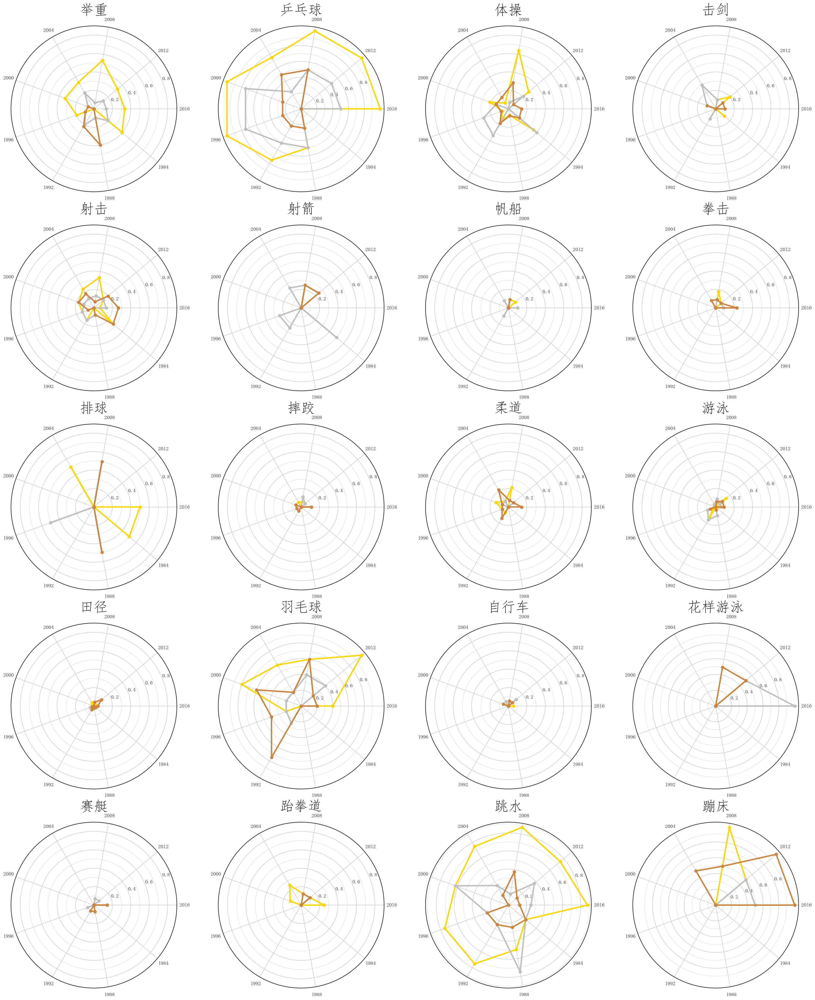

In [129]:
# 为每一项运动绘制雷达图
length = len(tmp_sport)
plt.figure(figsize=(30, 45))
for i in range(1,length+1):
    sport = tmp_sport[i-1]
    lis = [0,0,0]
    labels = ['Gold','Silver','Bronze']
    dic = {'2016':lis,'2012':lis,'2008':lis,'2004':lis,'2000':lis,'1996':lis,'1992':lis,'1988':lis,'1984':lis,'medal':labels}
    df = pd.DataFrame(dic)
    tmp = china[china['Sport'].isin([sport])]
    for index,row in tmp.iterrows():
        df.loc[df['medal']==row['Medal'],str(row['Year'])] = row['percentage']
    #  设置查看奖牌类型与它们显示的颜色
    medals = [('Gold', 'gold'), ('Silver', 'silver'), ('Bronze', 'peru')]
    labels = [2016,2012,2008,2004,2000,1996,1992,1988,1984]    
    ax = plt.subplot(round(length/4)+1,4,i, polar=True)
    for name, clr in medals:
        index_data = df[df['medal'] == name]
        values = index_data.values[0][:-1]
        angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False)
        values = np.concatenate((values, [values[0]]))
        angles = np.concatenate((angles, [angles[0]]))
        ax.plot(angles, values, 'o-', color=clr, linewidth=3, label=name)
    ax.set_thetagrids(angles[:-1] * 180 / np.pi, labels)
    ax.set_yticks(np.arange(0.2, 1, 0.2))
    ax.set_yticks(np.arange(0.1, 1, 0.1), minor=True)
    ax.grid(which='minor', alpha=0.5)
    ax.set_title(sport,fontsize=30)

# plt.savefig('中国强势项目.jpg')
plt.show()

## <span id="CAge">中国获金、银、铜牌选手的年龄分布</span>

In [130]:
# 保留中国获奖的选手并去除重复
tmp = data[data['region']=='中国']
tmp = tmp.astype({'Medal':'str'})
nan_index = tmp[(tmp['Medal'] =='nan')].index.tolist()
tmp = tmp.drop(index=nan_index)
# medalist = tmp.drop_duplicates(subset=['Year','Event','ID'])
# 计算各奖牌各年龄选手有多少
medalist = pd.DataFrame({'Count':tmp.groupby( ['Age', 'Medal'] ).size()}).reset_index()
tmp_age = medalist.drop_duplicates(subset=['Age']).Age.tolist()

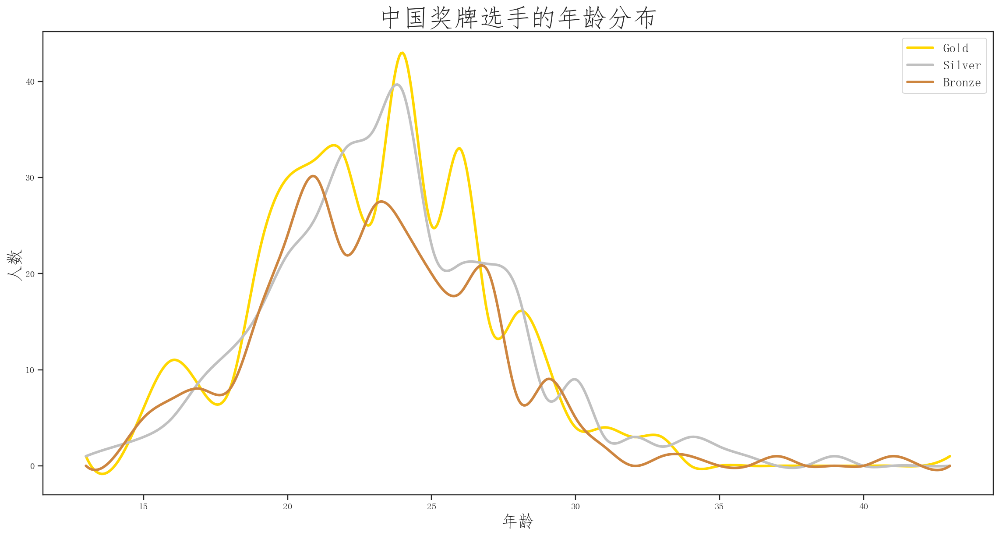

In [131]:
# 对获奖的最小选手年龄-最大年龄之间进行数据处理
age_list = [float(i) for i in range(int(tmp_age[0]), int(tmp_age[-1]+1))]
length = tmp_age[-1]+1-tmp_age[0]
for medal in ['Gold','Silver','Bronze']:
    med = [medal for i in range(int(length))]
    gold = pd.DataFrame({'Age':age_list,'Medal':med})
    medalist = pd.merge(gold,medalist,how='outer')
medalist = medalist.fillna(0)

# 绘制获奖选手的夺牌率分布图
plt.figure(figsize=(20, 10))
x = np.array(age_list)
for medal,color in zip(['Gold','Silver','Bronze'],['gold','silver','peru']):
    y = np.array(medalist[medalist['Medal']==medal].Count.tolist())
#     xs = np.linspace(tmp_age[0],tmp_age[-1],31)
    model = make_interp_spline(x, y)
    xs = np.linspace(tmp_age[0],tmp_age[-1],500)
    ys = model(xs)
    plt.plot(xs, ys, c=color,label=medal,linewidth='3')
plt.title('中国奖牌选手的年龄分布',fontsize=30)
plt.xlabel('年龄',fontsize=20)
plt.ylabel('人数',fontsize=20)
plt.legend(loc="upper right",fontsize=15)
# ylim(0,0.2)
plt.show()

## <span id="pingpong">中国优势项目及选手----以男子乒乓球单打为例</span>

### 历史男单打冠军数量纪录图

In [132]:
# 数据处理
champion = pd.read_excel('pingpong.xlsx',sheet_name='championCHN')
champion = champion.set_index('姓名').fillna(0).astype(int).reset_index()
columns = champion.columns.values.tolist()
columns.remove('姓名')
columns.remove('公开赛')
champion['大赛总和'] = champion[columns].sum(axis=1)
columns.append('公开赛')
x = champion.姓名.tolist()
c = Bar()
c.add_xaxis(x)
colors = ['#dc3023','#db5a6b','#f47983','#ffb3a7','#549688','#48c0a3','#1bd1a5','#b0a4e3','#cca4e3','#e0f0e9']
for i in range(0,9):
    c.add_yaxis(columns[i], champion[columns[i]].to_list(), stack="stack1")
c.set_colors(colors)
c.add_yaxis('公开赛', champion['公开赛'].to_list(), stack="stack2")
c.set_series_opts(label_opts=opts.LabelOpts(is_show=False))
c.set_global_opts(title_opts=opts.TitleOpts(title="中国历史男子大赛单打冠军数量",pos_left='center'),legend_opts=opts.LegendOpts(pos_top='6%'))
c.render_notebook()

### 中国男单历史世界排名(积分)前五位变化图【2007年1月至2022年4月】

In [133]:
point = pd.read_excel('pingpong.xlsx',sheet_name='point')
point['date'] = pd.to_datetime(point['date'],format='%Y-%m').dt.strftime('%Y-%m')
point = point.set_index('date').fillna(0).astype(int).reset_index()

length = point.shape[0]
tl = Timeline()
colors={'王励勤':'#003472','马琳':'#177cb0','王皓':'#065279','陈玘':'#1685a9','郝帅':'#2e4e7e',
       '马龙':'#0c8918','张继科':'#16a951','许昕':'#00bc12','闫安':'#96ce54','方博':'#bddd22',
       '樊振东':'#8d4bbb','林高远':'#cca4e3','梁靖崑':'#b0a4e3','王楚钦':'#edd1d8'}
for i in range(length):
    bar = (Bar())
    df = point.loc[i].to_frame().T.set_index('date').astype(int)
    top5x = []
    top5y = []
    y_data=[]
#     tmp_colors = []
    for j in range(5):
        tmp = df.idxmax(axis=1).tolist()[0]
        top5x.append(tmp)
        top5y.append(
            opts.BarItem(
                name = tmp,
                value = df[tmp].tolist()[0],
                itemstyle_opts=opts.ItemStyleOpts(color=colors[tmp])
            )
        )
#         y_data.append(df[tmp].tolist()[0]/100)
        df=df.drop(columns=[tmp])
#         tmp_colors.append(colors[tmp])
    df = df.reset_index()
    df['date'] = pd.to_datetime(df['date'],format='%Y-%m')
    top5x.reverse()
    top5y.reverse()
    bar.add_xaxis(top5x)
    bar.add_yaxis('', top5y)
    bar.reversal_axis()
    bar.set_global_opts(
        title_opts=opts.TitleOpts(
            "{}年{}月世界排名积分".format(df['date'].dt.year.values[0],df['date'].dt.month.values[0]),
            pos_left='center',
            pos_top='4%'
        ),
        legend_opts=opts.LegendOpts(is_show=False),
        
    )
    bar.set_series_opts(label_opts=opts.LabelOpts(position="right"))
    tl.add(bar, "{}年{}月".format(df['date'].dt.year.values[0],df['date'].dt.month.values[0]))
tl.render_notebook()

### 马龙选手个人胜率

In [134]:
# 数据处理
rival = pd.read_excel('Ma.xlsx',sheet_name='MaSingleRival')
tmp1 = pd.DataFrame({'Win':rival.groupby( ['Year','Winner'] ).size()}).reset_index()
tmp1 = tmp1[tmp1['Winner']=='MA Long'].drop(columns=['Winner'])
tmp2 = pd.DataFrame({'Total':rival.groupby( ['Year'] ).size()}).reset_index()
tmp=pd.merge(tmp1,tmp2,on=['Year'])
columns = tmp.columns.tolist()
columns.insert(4, 'Percentage')
winrate = tmp.reindex(columns=columns)
for index,row in winrate.iterrows():
    win = row['Win']
    total = row['Total']
    winrate.loc[index, 'Percentage'] = round(win / total,2)
line = (
    Line(init_opts=opts.InitOpts(width='500px', height='200px'))
    .add_xaxis(winrate.Year.astype(str).tolist())
    .add_yaxis(
        '胜率',
        winrate.Percentage.tolist(),
        linestyle_opts=opts.LineStyleOpts(color='#e9bb1d'),
        itemstyle_opts=opts.ItemStyleOpts(border_width=3, border_color="#e9bb1d"),
        markline_opts=opts.MarkLineOpts(data=[opts.MarkLineItem(type_="average")],symbol=['none','none']),
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title="年胜率",pos_left="center"),
        legend_opts=opts.LegendOpts(is_show=False),
        yaxis_opts=opts.AxisOpts(min_='dataMin')
    )
    .set_series_opts(label_opts=opts.LabelOpts(is_show=False))
)
tmp1 = pd.DataFrame({'Win':rival.groupby( ['Rival','Winner'] ).size()}).reset_index()
tmp1 = tmp1[tmp1['Winner']=='MA Long'].drop(columns=['Winner'])
tmp2 = pd.DataFrame({'Total':rival.groupby( ['Rival'] ).size()}).reset_index()
tmp=pd.merge(tmp1,tmp2,on=['Rival'])
tmp = tmp[tmp['Total']>3]
tmp = tmp.reset_index().drop(columns=['index'])
tmp.sort_values(by="Total",axis=0,ascending=False,inplace=True)
columns = tmp.columns.tolist()
columns.insert(4, 'Percentage1')
columns.insert(5, 'Percentage2')
hthrate = tmp.reindex(columns=columns).reset_index().drop(columns=['index'])
for index,row in hthrate.iterrows():
    win = int(row['Win'])
    total = int(row['Total'])
    hthrate.loc[index, 'Percentage1'] = round(win / total,2)
    hthrate.loc[index, 'Percentage2'] = round(1 - win / total,2)
hthrate.sort_values(by="Percentage1",axis=0,ascending=False,inplace=True)
x = hthrate.Rival.tolist()
y1 = hthrate.Percentage1.tolist()
y2 = hthrate.Percentage2.tolist()
bar = (
    Bar(init_opts=opts.InitOpts(width='1200px', height='900px'))
    .add_xaxis(x)
    .add_yaxis("", y2,stack="stack1")
    .add_yaxis("", y1,stack="stack1",itemstyle_opts=opts.ItemStyleOpts(color='#e9bb1d'))
    .reversal_axis()
    .set_series_opts(label_opts=opts.LabelOpts(position="inside"))
    .set_global_opts(
        title_opts=opts.TitleOpts(title="头对头胜率",pos_top="17%",pos_left="center"),
        tooltip_opts=opts.TooltipOpts(is_show=False),
    )
)

grid = (
    Grid(init_opts=opts.InitOpts(width='1000px', height='1000px'))
    .add(line, grid_opts=opts.GridOpts(pos_bottom="85%"))
    .add(bar, grid_opts=opts.GridOpts(pos_top="20%"))
    
)
grid.render_notebook()